# NBA Shot Prediction

Author: Arya Kondur

Course Project, UC Irvine, Math 10, F22

## Introduction

This project uses data of over 120,000 shots (pulled from a [Kaggle dataset](https://www.kaggle.com/datasets/dansbecker/nba-shot-logs)) during the 2014-2015 NBA regular season to predict whether a shot will make or miss. Information used in the predictive models include shot distance, distance of the closest defender, and time left on the shot clock. Feature engineering will be used to also examine the impact of having a "hot hand" (i.e. the notion that making several previous shots increase the likelihood of making the next shot) and the total time left in the game.

## Data Cleaning

We first import the necessary Python libraries and shot log dataset from Kaggle.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt

df = pd.read_csv("shot_logs.csv")
df.head()

,GAME_ID,MATCHUP,LOCATION,W,FINAL_MARGIN,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,...,SHOT_DIST,PTS_TYPE,SHOT_RESULT,CLOSEST_DEFENDER,CLOSEST_DEFENDER_PLAYER_ID,CLOSE_DEF_DIST,FGM,PTS,player_name,player_id
0,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,1,1,1:09,10.8,2,...,7.7,2,made,"Anderson, Alan",101187,1.3,1,2,brian roberts,203148
1,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,2,1,0:14,3.4,0,...,28.2,3,missed,"Bogdanovic, Bojan",202711,6.1,0,0,brian roberts,203148
2,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,3,1,0:00,NaN,3,...,10.1,2,missed,"Bogdanovic, Bojan",202711,0.9,0,0,brian roberts,203148
3,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,4,2,11:47,10.3,2,...,17.2,2,missed,"Brown, Markel",203900,3.4,0,0,brian roberts,203148
4,21400899,"MAR 04, 2015 - CHA @ BKN",A,W,24,5,2,10:34,10.9,2,...,3.7,2,missed,"Young, Thaddeus",201152,1.1,0,0,brian roberts,203148


Based on the above output, we see that the DataFrame contains the following information:
- **GAME_ID**: ID number for the game
- **MATCHUP**: Date and teams playing in the game
- **LOCATION**: Player's team location designation ('A' for away team; 'H' for home team)
- **W**: Game win status ('W' if player won the game; 'L' if player lost the game)
- **FINAL_MARGIN**: Margin of victory (or loss) for the player's team
- **SHOT_NUMBER**: The sequentially numbered shot for the player in the game
- **PERIOD**: Quarter number (values greater than 4 indicate overtime periods)
- **GAME_CLOCK**: Amount of time left on the game clock (formatted as minutes:seconds)
- **SHOT_CLOCK**: Amount of time left on the shot clock (valued between 0 and 24)
- **DRIBBLES**: Number of dribbles taken by the player before shooting
- **TOUCH_TIME**: Amount of time (in seconds) taken by player before shooting
- **SHOT_DIST**: Distance (in feet) of the shot
- **PTS_TYPE**: Shot point type designation (2 or 3)
- **SHOT_RESULT**: Shot result ('made' or 'missed')
- **CLOSEST_DEFENDER**: Name of closest defender
- **CLOSEST_DEFENDER_PLAYER_ID**: ID of closest defender
- **CLOSE_DEF_DIST**: Distance (in feet) between closest defender and player
- **FGM**: Field goal made (0 for missed shots; 1 for made shots)
- **PTS**: Number of points scored on the shot (0, 2, or 3)
- **player_name**: Name of player who took the shot
- **player_id**: ID of player who took the shot

Many of these variables represent numerical data that will likely be more useful in our predictive models such as shot distance, distance of the closest defender, and the time left on the shot clock.

To start the cleaning process, we remove a few columns in the DataFrame that are either redundant or not relevant to predicting the outcome of shots.

In [2]:
df = df.drop(columns=["GAME_ID", "MATCHUP", "LOCATION", "W", "FINAL_MARGIN", "PTS_TYPE", "CLOSEST_DEFENDER", "CLOSEST_DEFENDER_PLAYER_ID", "FGM", "PTS", "player_name", "player_id"])
df.head()

,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,TOUCH_TIME,SHOT_DIST,SHOT_RESULT,CLOSE_DEF_DIST
0,1,1,1:09,10.8,2,1.9,7.7,made,1.3
1,2,1,0:14,3.4,0,0.8,28.2,missed,6.1
2,3,1,0:00,NaN,3,2.7,10.1,missed,0.9
3,4,2,11:47,10.3,2,1.9,17.2,missed,3.4
4,5,2,10:34,10.9,2,2.7,3.7,missed,1.1


We also need to convert the values in the "GAME_CLOCK" column from strings to some form of numerical data. Since the "SHOT_CLOCK" data is reported in seconds, we can do the same for the "GAME_CLOCK" column.

In [3]:
def time_to_seconds(time_str):
    mins, secs = time_str.split(":")
    return 60 * int(mins) + int(secs)

df["GAME_CLOCK"] = df["GAME_CLOCK"].map(time_to_seconds)
df.head()

,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,TOUCH_TIME,SHOT_DIST,SHOT_RESULT,CLOSE_DEF_DIST
0,1,1,69,10.8,2,1.9,7.7,made,1.3
1,2,1,14,3.4,0,0.8,28.2,missed,6.1
2,3,1,0,NaN,3,2.7,10.1,missed,0.9
3,4,2,707,10.3,2,1.9,17.2,missed,3.4
4,5,2,634,10.9,2,2.7,3.7,missed,1.1


Just by looking at the first few rows in the DataFrame, we can see that some data in the "SHOT_CLOCK" column is missing. This is because when the time left on the game clock is less than 24 seconds, the shot clock is turned off. To fill in missing values in the "SHOT_CLOCK" column, it makes sense to replace all null values with the corresponding value from the "GAME_CLOCK" column.

In [4]:
df["SHOT_CLOCK"].fillna(df.GAME_CLOCK, inplace=True)
df.head()

,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,TOUCH_TIME,SHOT_DIST,SHOT_RESULT,CLOSE_DEF_DIST
0,1,1,69,10.8,2,1.9,7.7,made,1.3
1,2,1,14,3.4,0,0.8,28.2,missed,6.1
2,3,1,0,0.0,3,2.7,10.1,missed,0.9
3,4,2,707,10.3,2,1.9,17.2,missed,3.4
4,5,2,634,10.9,2,2.7,3.7,missed,1.1


We also need to convert the "SHOT_RESULT" column to a numerical value. We can let 0 represent missed shots and 1 represent made shots.

In [5]:
df["SHOT_RESULT"] = df["SHOT_RESULT"].map(lambda elem : 0 if elem == "missed" else 1)
df.head()

,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,TOUCH_TIME,SHOT_DIST,SHOT_RESULT,CLOSE_DEF_DIST
0,1,1,69,10.8,2,1.9,7.7,1,1.3
1,2,1,14,3.4,0,0.8,28.2,0,6.1
2,3,1,0,0.0,3,2.7,10.1,0,0.9
3,4,2,707,10.3,2,1.9,17.2,0,3.4
4,5,2,634,10.9,2,2.7,3.7,0,1.1


## Feature Engineering

We now add two additional features not currently present in the original dataset to help our predictive models.

### Total Time Left

The dataset currently has a column ("GAME_CLOCK") that describes how much time is left on the game clock, but this resets every quarter. It would be interesting to see how the current quarter and game clock play a factor in shot prediction as a single feature. This results in the "TOT_TIME_LEFT" feature which captures the total amount of time left in the game. After all, as the game continues, the likelihood of shots going in may decrease due to fatigue, pressure, or other intangible factors. Since each quarter is 12 minutes (or 720 seconds), we calculate the total time left by multiplying the number of quarters remaining by 720 and adding the time left on the game clock in the current quarter. For overtime periods (the "PERIOD" column will have a value greater than 4), the total time left in the game is simply the amount of time left on the game clock.

In [6]:
def get_total_time_left(row):
    if row["PERIOD"] > 4:
        return row["GAME_CLOCK"]
    # 12 * 60 seconds in (4 - period) remaining quarters + game_clock seconds in the current quarter
    return 12 * 60 * (4 - row["PERIOD"]) + row["GAME_CLOCK"]

df["TOT_TIME_LEFT"] = df.apply(get_total_time_left, axis=1)
df.head()

,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,TOUCH_TIME,SHOT_DIST,SHOT_RESULT,CLOSE_DEF_DIST,TOT_TIME_LEFT
0,1,1,69,10.8,2,1.9,7.7,1,1.3,2229.0
1,2,1,14,3.4,0,0.8,28.2,0,6.1,2174.0
2,3,1,0,0.0,3,2.7,10.1,0,0.9,2160.0
3,4,2,707,10.3,2,1.9,17.2,0,3.4,2147.0
4,5,2,634,10.9,2,2.7,3.7,0,1.1,2074.0


### "Hot Hand"

The idea of a "hot hand" claims that players who make their previous shots are more likely to make their next shot. A detailed explanation and analysis of this phenomenon can be found in [this paper](https://www.sciencedirect.com/science/article/abs/pii/S0014292121001240). For this project, we will just consider whether a player made the immediately previous shot instead of considering a streak of previous made shots. This way, the new feature we add can be limited to a binary variable, with 0 representing a previous missed shot and 1 representing a previous made shot. If the shot is a player's first attempt in the game, we use a value of 0.

In [7]:
df["PREV_SHOT_RESULT"] = np.where((df["SHOT_NUMBER"] == 1) | (df["SHOT_RESULT"].shift(1) == 0), 0, 1)
df.head()

,SHOT_NUMBER,PERIOD,GAME_CLOCK,SHOT_CLOCK,DRIBBLES,TOUCH_TIME,SHOT_DIST,SHOT_RESULT,CLOSE_DEF_DIST,TOT_TIME_LEFT,PREV_SHOT_RESULT
0,1,1,69,10.8,2,1.9,7.7,1,1.3,2229.0,0
1,2,1,14,3.4,0,0.8,28.2,0,6.1,2174.0,1
2,3,1,0,0.0,3,2.7,10.1,0,0.9,2160.0,0
3,4,2,707,10.3,2,1.9,17.2,0,3.4,2147.0,0
4,5,2,634,10.9,2,2.7,3.7,0,1.1,2074.0,0


We now perform a last bit of cleaning. Interestingly, the "TOUCH_TIME" column contains values that are entered incorrectly. Since this variable measures the amount of time a player has the ball before shooting, it makes sense that the value should be positive. However, we notice that there are over 3000 rows in which the column has negative values.

In [8]:
(df["TOUCH_TIME"] <= 0).sum()

3358

We remove these rows below. Note that this removal process must be done after adding the "PREV_SHOT_RESULT" feature because it requires knowledge of the immediately previous row. Removing rows and then computing "PREV_SHOT_RESULT" would result in some incorrect values. For example, if a row with "SHOT_NUMBER" = 2 is removed, the "PREV_SHOT_RESULT" value for the row with "SHOT_NUMBER" = 3 would use the "SHOT_RESULT" value from the row with "SHOT_NUMBER" = 1, which would be incorrect.

In [9]:
df = df.loc[df["TOUCH_TIME"] > 0]
df.shape

(124711, 11)

After all data cleaning and feature engineering, we have a DataFrame with just under 125,000 shots and 11 features.

## Feature Selection

In this section, we explore which features are the most useful for our predictive models. We find these features through visual observation of charts. The first chart we create is a heatmap of how the different features in the dataset are correlated to each other. A greater correlation value indicates a stronger relationship between two variables and negative values represent an inverse relationship.

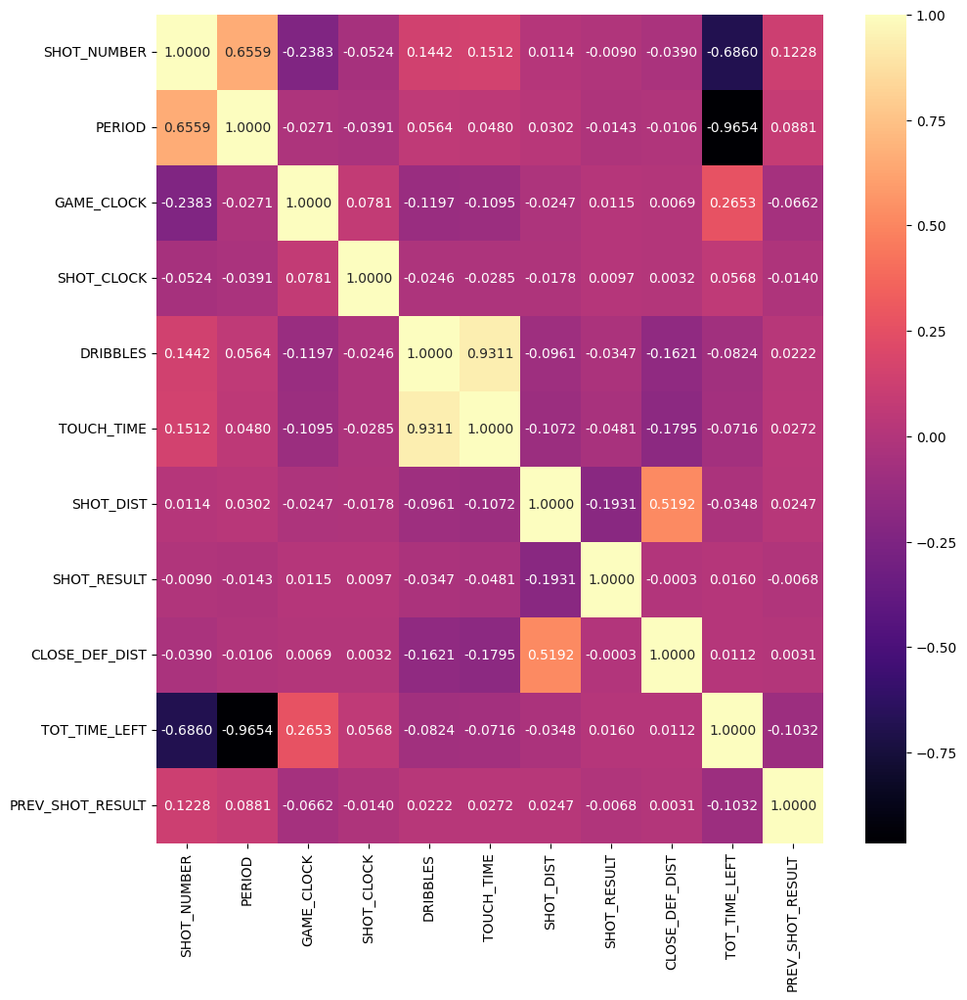

In [10]:
plt.figure(figsize=(11,11))
sns.heatmap(df.corr(), annot=True, cmap="magma", fmt=".4f");

Based on the above heatmap, we see that our target variable ("SHOT_RESULT") is most strongly correlated with "SHOT_DIST". Its relationships with the other input variables are not as strong. However, it is telling that "SHOT_DIST" has a somewhat strong correlation with "CLOSE_DEF_DIST". Based on the below scatterplot, we also see a higher concentration of made baskets with low shot distance and also a greater number of made shots with a larger closest defender distance. As such, we can consider "CLOSE_DEF_DIST" to be an important feature as well. By using the chart slider, we observe that many of the shots that were missed from farther away from the basket were also taken with a low shot clock (less than 4 seconds). On the other hand, most made shots were not taken with a low shot clock. This observation indicates that "SHOT_CLOCK" is likely an important feature. We also want to consider "TOT_TIME_LEFT" since it maintains a significant correlation with "GAME_CLOCK" and extremely strong negative correlations with "PERIOD" and "SHOT_NUMBER". As such, it appears to be a feature that can properly encompass several other features, as was the point of creating it during the feature engineering process.

In [11]:
# Allow altair to surpass max rows limit because the dataset is so large
alt.data_transformers.disable_max_rows()

slider = alt.binding_range(min=0, max=24, step=1)
selector = alt.selection_single(
    fields=['cutoff'],
    bind=slider,
    init={'cutoff': 4},
    name="slider"
)

# Sample a few thousand rows to display in the chart instead of all rows (avoid output overflow)
alt.Chart(df.sample(10000)).mark_circle().encode(
    x = "SHOT_DIST:Q",
    y = "CLOSE_DEF_DIST:Q",
    color = alt.Color("SHOT_RESULT:N", scale=alt.Scale(domain=[0,1], range=['red', 'green'])),
    size = alt.condition(alt.datum.SHOT_CLOCK <= selector.cutoff, alt.value(20), alt.value(5)),
    opacity = alt.condition(alt.datum.SHOT_CLOCK <= selector.cutoff, alt.value(1), alt.value(0.5)),
    tooltip = ["SHOT_CLOCK", "TOT_TIME_LEFT", "PERIOD", "GAME_CLOCK"]
).facet(
    column="SHOT_RESULT:N"
).add_selection(
    selector
).interactive()

alt.FacetChart(...)

We now turn to our second visual method (histograms) to find which other features are important. We need to consider the following non-binary quantitative variables: "GAME_CLOCK", "DRIBBLES", "TOUCH_TIME". For each feature, we bin the data and the y-values for the histogram indicate the field goal percentage (percentage of made shots) for that particular bin.

In [12]:
histograms = []

features = ["GAME_CLOCK", "DRIBBLES", "TOUCH_TIME"]

# Again, to avoid output overflow, we only use a few thousand rows for each histogram
for feature in features:
    c = alt.Chart(df.sample(12500)).mark_bar().encode(
        x = alt.X(feature, bin=True),
        y = "average(SHOT_RESULT)"
    )

    text = c.mark_text(
        align="center", baseline="top", dy=10, color="white"
    ).encode(
        text=alt.Text("average(SHOT_RESULT)", format="0.3f")
    )
    histograms.append(c+text)

alt.vconcat(*histograms)


alt.VConcatChart(...)

Based on the histograms, we don't see much fluctuation in field goal percentage across the bins for the "GAME_CLOCK" feature. This indicates that it may not be useful for our predictive models. On the other hand, field goal percentage seems to decrease as dribbles and touch time increase, meaning the "DRIBBLES" and "TOUCH_TIME" features are likely important. However, based on our heatmap, we notice that these two features are very strongly correlated (coefficient of about 0.93). Thus, it does not make sense to use both features (the second feature will not help by much), so we can keep only the "DRIBBLES" features since there appears to be more fluctuation in its corresponding histogram.

Finally, we want to check whether the "PREV_SHOT_RESULT" feature is important. Since it is a categorical variable (with binary values) and the output feature ("SHOT_RESULT") is also a binary variable, we can use a chi-squared test to find the correlation between these two. [This guide](https://towardsdatascience.com/chi-square-test-with-python-d8ba98117626) provides an explanation of how the chi-squared test works and a simpler version of the code needed for our purposes was found in [this blog post](https://thinkingneuron.com/how-to-measure-the-correlation-between-two-categorical-variables-in-python/).

In [13]:
from scipy.stats import chi2_contingency

cross_tab_result = pd.crosstab(index=df["PREV_SHOT_RESULT"], columns=df["SHOT_RESULT"])
chi_sq_result = chi2_contingency(cross_tab_result)
chi_sq_result[1]

0.016609423301651813

Since the p-value above is less than 0.05, we can claim that there is a significant correlation between "PREV_SHOT_RESULT" and "SHOT_RESULT", making the former an important feature for us to investigate. All of the above analysis leads to the conclusion that the following input features are the most important for our predictive models: "SHOT_CLOCK", "DRIBBLES", "SHOT_DIST", "CLOSE_DEF_DIST", "TOT_TIME_LEFT", "PREV_SHOT_RESULT". We keep only these features and the target variable in the DataFrame.

In [14]:
in_features = ["SHOT_CLOCK", "DRIBBLES", "SHOT_DIST", "CLOSE_DEF_DIST", "TOT_TIME_LEFT", "PREV_SHOT_RESULT"]
out_feature = ["SHOT_RESULT"]
df = df[in_features+out_feature]
df.head()

,SHOT_CLOCK,DRIBBLES,SHOT_DIST,CLOSE_DEF_DIST,TOT_TIME_LEFT,PREV_SHOT_RESULT,SHOT_RESULT
0,10.8,2,7.7,1.3,2229.0,0,1
1,3.4,0,28.2,6.1,2174.0,1,0
2,0.0,3,10.1,0.9,2160.0,0,0
3,10.3,2,17.2,3.4,2147.0,0,0
4,10.9,2,3.7,1.1,2074.0,0,0


## Model Creation/Evaluation

In this section, we create several different models and evaluate their predictive performance on test data. First, we partition the data into training and test sets using a 75-25 split.

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[in_features], df[out_feature], train_size=0.75)

### Logistic Regression

We implement a logistic regression model since it is appropriate for binary classification problems (made shot vs missed shot). This is because instead of predicting the outcome directly, logistic regression calculates the logarithm of an optimal linear combination of the input features to find the probabilities of the two possible output labels. Then, the actual prediction is simply the label with greater probability. Below, we fit the logistic regression model on the training data and calculate the score (accuracy) on the test data.

In [16]:
from sklearn.linear_model import LogisticRegression

clf_lr = LogisticRegression()
# Use ravel() to avoid a DataConversionWarning
clf_lr.fit(X_train, y_train.values.ravel())

print("Logistic Regression Model")
print("Training accuracy:", clf_lr.score(X_train, y_train))
print("Test accuracy:", clf_lr.score(X_test, y_test))

Logistic Regression Model
Training accuracy: 0.6075075107181422
Test accuracy: 0.605170312399769


We find that the logistic regression model performs around the same on both the training and test data, with about 60.52% accuracy on the test data. There is no overfitting here, but it is clear the model does not do very well. This could be because the target label ("SHOT_RESULT") has a poor linear correlation with the input features.

### Decision Tree Classifier

Decision trees are commonly used in prediction analysis, which is the entire premise of this project. The decision tree continually branches off of indicators based on input features and ultimately reaches leaf nodes that contain the predicted value. They are also capable of handling continuous and categorical input features, both of which exist in our dataset. We also believe that the decision tree model should perform better than the logistic regression model because the data is not linearly separable. To choose the best parameters (maximum depth and maximum leaf nodes) for the decision tree model, we use `GridSearchCV`. We test models with maximum depth and maximum leaf nodes between 2 and 10, inclusive. [Documentation](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) was used to aid in writing the below code.

In [17]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

parameters = {
    "max_depth" : list(range(2,11)), 
    "max_leaf_nodes" : list(range(2,11))
}

dec_tree = DecisionTreeClassifier()
clf_dt = GridSearchCV(dec_tree, parameters)
clf_dt.fit(X_train, y_train.values.ravel())

print("Decision Tree Model")
print("Best parameters:", clf_dt.best_params_)
print("Training accuracy:", clf_dt.score(X_train, y_train))
print("Test accuracy:", clf_dt.score(X_test, y_test))

Decision Tree Model
Best parameters: {'max_depth': 5, 'max_leaf_nodes': 10}
Training accuracy: 0.6135909251280297
Test accuracy: 0.6138944127269228


We find that the decision tree model that performs the best uses a maximum depth of 5 and a maximum of 10 leaf nodes. Under this model, there is no overfitting since the training accuracy is only slightly better than the test accuracy. With a test accuracy of around 61.39%, the decision tree model does perform better than the logistic regression model, albeit marginally. However, while an improvement of around 1% seems small, it is quite significant when considering the large nature of our dataset.

### Random Forest Classifier

The final predictive model we use is a random forest classifier which, like the previous two models, is useful for binary classification. A random forest is essentially an aggregate of several individual decision trees and the predicted output label is simply the class that is selected by the most decision trees. We expect the random forest classifier to perform better than the single decision tree classifier since it acts as an ensemble classifier by taking the output of several trees into consideration. Like before, we use grid search to find the optimal parameters (number of decision trees, maximum depth, and maximum number of leaf nodes). We give `GridSearchCV` a number of estimators in the list [40, 50, 60, 70], a maximum depth between 3 and 5 (inclusive) or no maximum depth, and between 4 to 10 maximum leaf nodes (inclusive).


In [18]:
from sklearn.ensemble import RandomForestClassifier

# NOTE: Due to the use of many possible parameter values for a random forest, 
# this code will take a long time to run (~15 minutes).

parameters = {
    "n_estimators" : list(range(40,71,10)), 
    "max_depth" : list(range(3,6)) + [None], 
    "max_leaf_nodes" : list(range(4,11))
}

forest = RandomForestClassifier()
clf_rf = GridSearchCV(forest, parameters)
# Use ravel() to avoid a DataConversionWarning
clf_rf.fit(X_train, y_train.values.ravel())

print("Random Forest Model")
print("Best parameters:", clf_rf.best_params_)
print("Training accuracy:", clf_rf.score(X_train, y_train))
print("Test accuracy:", clf_rf.score(X_test, y_test))

Random Forest Model
Best parameters: {'max_depth': 5, 'max_leaf_nodes': 10, 'n_estimators': 40}
Training accuracy: 0.6174505254829846
Test accuracy: 0.6192186798383476


We find that the random forest model that performs the best uses 40 estimators (i.e. decision trees), with a maximum depth of 5 and 10 maximum leaf nodes. Under this model, there is no overfitting (as expected) since it is an ensemble model that combines several individual components. With a test accuracy of around 61.92%, it performs about the same as the single decision tree classifier and significantly better than the logistic regression model. However, the overall performance is still mediocre.

## Summary

This project used three models on numerical and categorical data regarding shots taken by NBA players to predict whether a shot would make or miss. The models (logistic regression, decision tree, random forest) tended to have an accuracy of around 60-62%, which is not great, indicating that shot prediction is a difficult task and may require more advanced features than the ones we considered or more robust models. As a result, we understand that feature selection and hyperparameter tuning are two very important steps in creating highly accurate models.

## References

Your code above should include references.  Here is some additional space for references.

* What is the source of your dataset(s)?

NBA shot log data from Kaggle: https://www.kaggle.com/datasets/dansbecker/nba-shot-logs

* List any other references that you found helpful.

1. Paper on "hot hand" in the NBA: https://www.sciencedirect.com/science/article/abs/pii/S0014292121001240
2. Adding column to dataframe based on previous row: https://stackoverflow.com/questions/66563161/how-to-create-a-new-column-based-on-row-value-in-previous-row-in-pandas-datafram
    - This was helpful for creating the "PREV_SHOT_RESULT" column in the Feature Engineering section
3. Creating correlation heatmap: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e
4. Formatting color/text in heatmap: https://seaborn.pydata.org/generated/seaborn.heatmap.html
5. Disabling MaxRowsError in altair: https://altair-viz.github.io/user_guide/faq.html#disabling-maxrowserror
    - This was needed because the shot log dataset is larger than altair can handle
6. Changing scatterplot colors: https://altair-viz.github.io/user_guide/customization.html#color-domain-and-range
7. Adding label to histogram: https://altair-viz.github.io/gallery/bar_chart_with_labels.html
8. Theory behind categorical variable correlation (chi-squared test): https://towardsdatascience.com/chi-square-test-with-python-d8ba98117626
9. Simplified code for chi-sqared test: https://thinkingneuron.com/how-to-measure-the-correlation-between-two-categorical-variables-in-python/
10. Solution to DataConversionWarning when fitting training data: https://stackoverflow.com/questions/34165731/a-column-vector-y-was-passed-when-a-1d-array-was-expected
11. Hyperparameter selection with grid search: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

## Submission

Using the Share button at the top right, **enable Comment privileges** for anyone with a link to the project. Then submit that link on Canvas.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=a98bf632-64d6-4d7d-9b76-2f0c50b9437a' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>